In [1]:
!pip install turicreate

In [2]:
import turicreate as tc
import matplotlib.pyplot as plt

In [3]:
cd /Users/eddiemora/Desktop/Train 

/Users/eddiemora/Desktop/Train


In [4]:
train_data = tc.image_analysis.load_images("/Users/eddiemora/Desktop/Train/", with_path=True)
len(train_data)

43

In [5]:
import os
train_data["label"] = train_data["path"].apply(lambda path: 
                                               os.path.basename(os.path.split(path)[0]))
train_data["label"].value_counts().print_rows(num_rows=20)


+-------------+-------+
|    value    | count |
+-------------+-------+
|  Correctas  |   27  |
| Incorrectas |   16  |
+-------------+-------+
[2 rows x 2 columns]



/Users/eddiemora/anaconda3/lib/python3.7/site-packages/turicreate/aggregate.py:91: UserWarning: Passing parameter(s) to COUNT is deprecated. This functionality will be removed in the next major release. Any passed parameters are ignored.
  warnings.warn('Passing parameter(s) to COUNT is deprecated. This functionality will be removed in '


In [6]:
# Train the image classifier
model = tc.image_classifier.create(train_data, target="label", 
                                   model="squeezenet_v1.1",
                                   verbose=True, max_iterations=100)

Downloading base mlmodel

Downloading https://docs-assets.developer.apple.com/coreml/models/SqueezeNet.mlmodel to /var/folders/sg/qg8d10f50n37k3vq685yg38r0000gn/T/model_cache/squeezenet_v1.1.mlmodel

Analyzing and extracting image features.

+------------------+--------------+------------------+

| Images Processed | Elapsed Time | Percent Complete |

+------------------+--------------+------------------+

| 43               | 1.06s        | 100%             |

+------------------+--------------+------------------+

Logistic regression:

--------------------------------------------------------

Number of examples          : 43

Number of classes           : 2

Number of feature columns   : 1

Number of unpacked features : 1000

Number of coefficients      : 1001

Starting L-BFGS

--------------------------------------------------------

+-----------+----------+-----------+--------------+-------------------+

| Iteration | Passes   | Step size | Elapsed Time | Training Accuracy |

+-----------+----------+-----------+--------------+-------------------+

| 0         | 6        | 0.003969  | 0.108793     | 0.627907          |

Warning: Reached max step size.

| 1         | 15       | 25.000000 | 0.290221     | 0.627907          |

| 2         | 16       | 25.000000 | 0.329906     | 0.906977          |

| 3         | 19       | 4.694904  | 0.387760     | 0.976744          |

| 4         | 21       | 4.694904  | 0.430965     | 0.953488          |

| 9         | 33       | 1.230803  | 0.660422     | 1.000000          |

| 40        | 87       | 1.649913  | 1.954653     | 1.000000          |

+-----------+----------+-----------+--------------+-------------------+

In [7]:
output = model.classify(train_data)
output

class,probability
Correctas,0.9941925298583671
Correctas,0.9938147818034658
Correctas,0.9988287376365038
Correctas,0.9998890024389888
Correctas,0.9979002296090922
Correctas,0.9945061847457585
Correctas,0.9999385626563245
Correctas,0.9934440530560715
Correctas,0.9958532917570069
Correctas,0.999531390851292


,path,image,label,class,probability
0,/Users/eddiemora/Desktop/Train/Correctas/CL_Troy_Bar_Plate_Lady_450.jpg,,Correctas,Correctas,0.994193
1,/Users/eddiemora/Desktop/Train/Correctas/Captura de Pantalla 2019-10-09 a la(s) 7.02.54 p. m..png,,Correctas,Correctas,0.993815
2,/Users/eddiemora/Desktop/Train/Correctas/Captura de Pantalla 2019-10-09 a la(s) 7.03.52 p. m..png,,Correctas,Correctas,0.998829
3,/Users/eddiemora/Desktop/Train/Correctas/Captura de Pantalla 2019-10-09 a la(s) 7.04.36 p. m..png,,Correctas,Correctas,0.999889
4,/Users/eddiemora/Desktop/Train/Correctas/Captura de Pantalla 2019-10-09 a la(s) 7.08.51 p. m..png,,Correctas,Correctas,0.997900
5,/Users/eddiemora/Desktop/Train/Correctas/DSC_1067.jpg,,Correctas,Correctas,0.994506
6,/Users/eddiemora/Desktop/Train/Correctas/ERE44.jpg,,Correctas,Correctas,0.999939
7,/Users/eddiemora/Desktop/Train/Correctas/IMG_9919-1024x768.jpg,,Correctas,Correctas,0.993444
8,/Users/eddiemora/Desktop/Train/Correctas/Rounded-Back.jpg,,Correctas,Correctas,0.995853
9,/Users/eddiemora/Desktop/Train/Correctas/Screen-Shot-2017-08-08-at-08.11.29.png,,Correctas,Correctas,0.999531

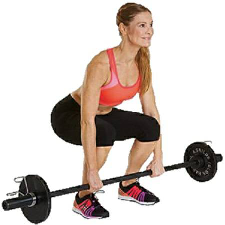
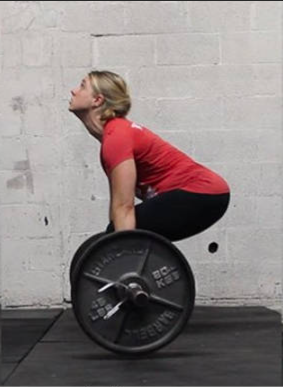
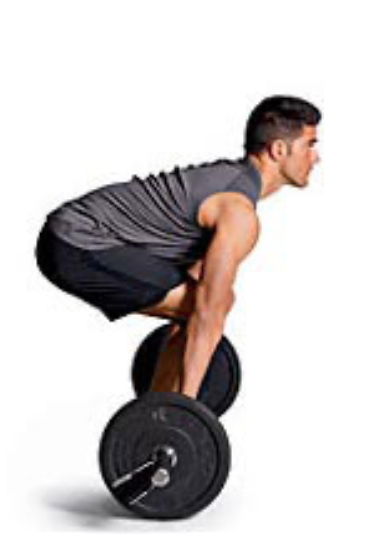
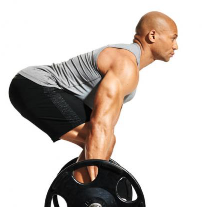
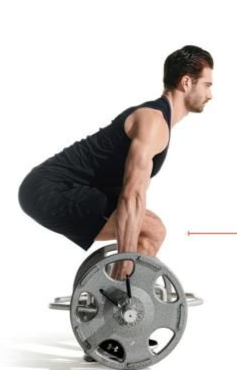
...
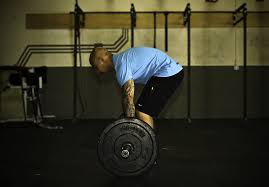
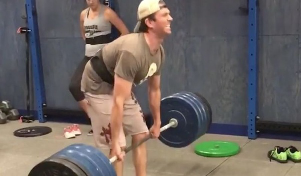
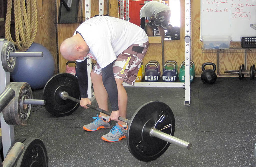
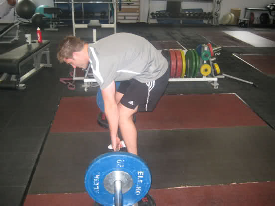
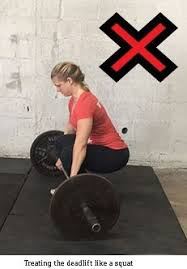

In [8]:
images_with_prediction = train_data.add_columns(output)
images_with_prediction.explore()

,path,image,label,class,probability
0,/Users/eddiemora/Desktop/Train/Correctas/CL_Troy_Bar_Plate_Lady_450.jpg,,Correctas,Correctas,0.994193
1,/Users/eddiemora/Desktop/Train/Correctas/Captura de Pantalla 2019-10-09 a la(s) 7.02.54 p. m..png,,Correctas,Correctas,0.993815
2,/Users/eddiemora/Desktop/Train/Correctas/Captura de Pantalla 2019-10-09 a la(s) 7.03.52 p. m..png,,Correctas,Correctas,0.998829
3,/Users/eddiemora/Desktop/Train/Correctas/Captura de Pantalla 2019-10-09 a la(s) 7.04.36 p. m..png,,Correctas,Correctas,0.999889
4,/Users/eddiemora/Desktop/Train/Correctas/Captura de Pantalla 2019-10-09 a la(s) 7.08.51 p. m..png,,Correctas,Correctas,0.997900
5,/Users/eddiemora/Desktop/Train/Correctas/DSC_1067.jpg,,Correctas,Correctas,0.994506
6,/Users/eddiemora/Desktop/Train/Correctas/ERE44.jpg,,Correctas,Correctas,0.999939
7,/Users/eddiemora/Desktop/Train/Correctas/IMG_9919-1024x768.jpg,,Correctas,Correctas,0.993444
8,/Users/eddiemora/Desktop/Train/Correctas/Rounded-Back.jpg,,Correctas,Correctas,0.995853
9,/Users/eddiemora/Desktop/Train/Correctas/Screen-Shot-2017-08-08-at-08.11.29.png,,Correctas,Correctas,0.999531

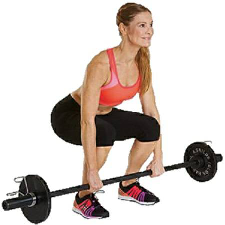
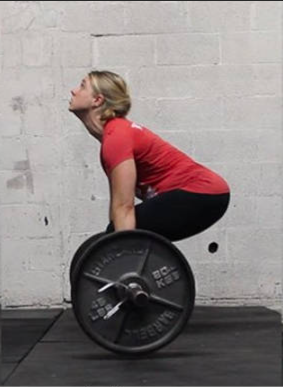
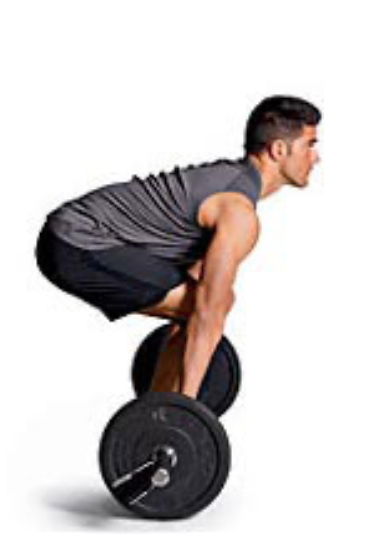
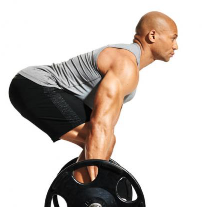
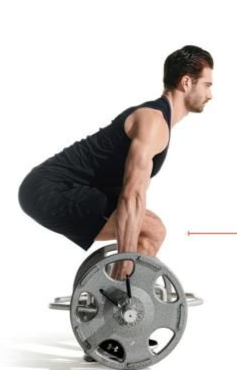
...
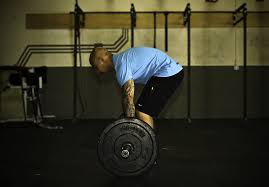
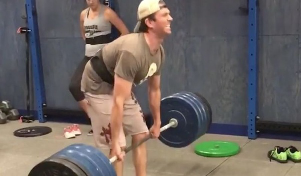
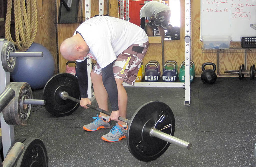
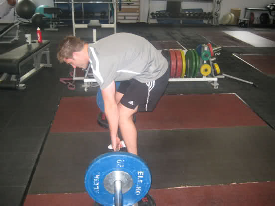
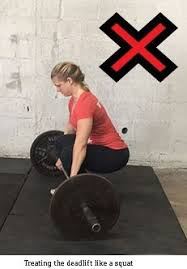

In [9]:
images_filtered = images_with_prediction[
    (images_with_prediction["probability"] > 0.9) &
    (images_with_prediction["label"]) != images_with_prediction["class"]
]
images_filtered.explore()

In [12]:
predictions = model.predict(train_data, output_type='probability_vector')

In [13]:
predictions[0]

array('d', [0.9941925298583671, 0.0058074701416328525])

In [14]:
labels = train_data["label"].unique().sort()
preds = tc.SArray(predictions[0])
tc.SFrame()

Columns:
	None

Rows: 0

Data:
	[]

In [15]:
model.export_coreml("gymassistant.mlmodel")

Download completed: /var/folders/sg/qg8d10f50n37k3vq685yg38r0000gn/T/model_cache/squeezenet_v1.1-symbol.json
Download completed: /var/folders/sg/qg8d10f50n37k3vq685yg38r0000gn/T/model_cache/squeezenet_v1.1-0000.params
